# Enlace a la Competición

https://www.kaggle.com/competitions/playground-series-s3e18

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option("display.max_rows", None, "display.max_columns", None)
import os
from scipy.stats.mstats import winsorize
import scipy.stats as stats

In [ ]:
from google.colab import files
files.upload()

Saving train.csv to train.csv


{'train.csv': b'id,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2,EC3,EC4,EC5,EC6\n0,323.3907823,9.879917853,5.875576147,5.875576147,4.304757339,4.304757339,2.754513141,1.749203102,0.0,11.93829424,222.0680796,1.181818182,1.727272727,2.363636364,-0.24,212.163,8.17,11.92250394,0.171585412,4,0.0,91.53649165,0.0,0.0,0.0,17.74406608,0.0,4.794537184,35.52735686,0,0,1,1,0,0,0,0\n1,273.7237977,7.259037475,4.441466753,5.834957955,3.285046029,4.48523529,2.20137482,1.289774594,45.13547137,0.0,260.0297186,1.346153846,2.076923077,2.769230769,-0.09,247.031,3.201490511,10.93233796,-4.830449539,10,24.41586555,7.822697123,0.0,0.0,0.0,7.822697123,30.70589228,13.8256584,44.7073097,0,0,0,1,1,0,0,0\n2,521.6438224,10.911302

In [ ]:
train = pd.read_csv('train.csv')

In [ ]:
files.upload()

Saving test.csv to test.csv


{'test.csv': b'id,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2\n14838,344.6323707,7.283603478,4.473965521,5.834957955,3.412257384,4.651529687,2.096558189,1.116432681,49.45858146,0.0,204.0797069,1.384615385,1.923076923,2.307692308,-0.24,192.197,3.247122771,10.24869284,-4.734641975,7,18.31189916,13.51244052,0.0,0.0,0.0,26.80927218,24.53980033,4.794537184,47.30408232,1,1\n14839,1432.410201,10.66386902,7.079025681,8.065214964,5.297097164,5.297097164,3.924155186,2.569694053,0.0,29.78317491,315.2103308,0.571428571,0.857142857,1.159285714,-1.81,280.263,10.07,11.91792687,-0.303333333,4,0.0,0.0,34.94737391,98.32398665,9.606881965,0.0,53.37823529,0.0,43.16666667,0,0\n14840,83.35260811,3.931851653,1.774215467,1.7742154

In [ ]:
test = pd.read_csv('test.csv')

In [ ]:
train.drop(['EC3', 'EC4', 'EC5', 'EC6'], axis=1, inplace=True)
train.head()

,id,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2
0,0,323.390782,9.879918,5.875576,5.875576,4.304757,4.304757,2.754513,1.749203,0.000000,11.938294,222.068080,1.181818,1.727273,2.363636,-0.24,212.163,8.170000,11.922504,0.171585,4,0.000000,91.536492,0.000000,0.000000,0.000000,17.744066,0.000000,4.794537,35.527357,0,0,1,1
1,1,273.723798,7.259037,4.441467,5.834958,3.285046,4.485235,2.201375,1.289775,45.135471,0.000000,260.029719,1.346154,2.076923,2.769231,-0.09,247.031,3.201491,10.932338,-4.830450,10,24.415866,7.822697,0.000000,0.000000,0.000000,7.822697,30.705892,13.825658,44.707310,0,0,0,1
2,2,521.643822,10.911303,8.527859,11.050864,6.665291,9.519706,5.824822,1.770579,15.645394,6.606882,382.131027,1.085714,1.742857,2.400000,-0.78,354.106,15.033890,11.238048,-5.066255,9,0.000000,15.645394,0.000000,53.378235,0.000000,15.645394,73.143616,17.964475,45.660120,0,0,1,1
3,3,567.431166,12.453343,7.089119,12.833709,6.478023,10.978151,7.914542,3.067181,95.639554,0.000000,530.070277,1.162791,1.573770,2.270270,-1.30,506.124,6.724301,11.171170,-5.276575,19,42.727765,21.335138,0.000000,0.000000,6.420822,15.645394,62.107304,31.961948,87.509997,0,0,1,1
4,4,112.770735,4.414719,2.866236,2.866236,1.875634,1.875634,1.036450,0.727664,17.980451,12.841643,118.062994,1.444444,2.111111,2.555556,-1.10,108.056,3.931272,9.855741,-1.676296,4,6.041841,11.938611,6.923737,19.386400,0.000000,11.938611,18.883484,9.589074,33.333333,2,2,1,0


In [ ]:
targets = ['EC1', 'EC2']

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14838 entries, 0 to 14837
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 14838 non-null  int64  
 1   BertzCT            14838 non-null  float64
 2   Chi1               14838 non-null  float64
 3   Chi1n              14838 non-null  float64
 4   Chi1v              14838 non-null  float64
 5   Chi2n              14838 non-null  float64
 6   Chi2v              14838 non-null  float64
 7   Chi3v              14838 non-null  float64
 8   Chi4n              14838 non-null  float64
 9   EState_VSA1        14838 non-null  float64
 10  EState_VSA2        14838 non-null  float64
 11  ExactMolWt         14838 non-null  float64
 12  FpDensityMorgan1   14838 non-null  float64
 13  FpDensityMorgan2   14838 non-null  float64
 14  FpDensityMorgan3   14838 non-null  float64
 15  HallKierAlpha      14838 non-null  float64
 16  HeavyAtomMolWt     148

In [ ]:
train.EC1.value_counts()

1    9908
0    4930
Name: EC1, dtype: int64

In [ ]:
train.EC2.value_counts()

1    11855
0     2983
Name: EC2, dtype: int64

In [ ]:
train.duplicated().sum()

0

In [ ]:
train.isnull().sum()

id                   0
BertzCT              0
Chi1                 0
Chi1n                0
Chi1v                0
Chi2n                0
Chi2v                0
Chi3v                0
Chi4n                0
EState_VSA1          0
EState_VSA2          0
ExactMolWt           0
FpDensityMorgan1     0
FpDensityMorgan2     0
FpDensityMorgan3     0
HallKierAlpha        0
HeavyAtomMolWt       0
Kappa3               0
MaxAbsEStateIndex    0
MinEStateIndex       0
NumHeteroatoms       0
PEOE_VSA10           0
PEOE_VSA14           0
PEOE_VSA6            0
PEOE_VSA7            0
PEOE_VSA8            0
SMR_VSA10            0
SMR_VSA5             0
SlogP_VSA3           0
VSA_EState9          0
fr_COO               0
fr_COO2              0
EC1                  0
EC2                  0
dtype: int64

In [ ]:
train.nunique()

id                   14838
BertzCT               2368
Chi1                  1259
Chi1n                 3157
Chi1v                 3306
Chi2n                 3634
Chi2v                 3725
Chi3v                 3448
Chi4n                 2930
EState_VSA1            719
EState_VSA2            445
ExactMolWt            1666
FpDensityMorgan1       556
FpDensityMorgan2       650
FpDensityMorgan3       654
HallKierAlpha          388
HeavyAtomMolWt         860
Kappa3                2245
MaxAbsEStateIndex     2356
MinEStateIndex        2142
NumHeteroatoms          40
PEOE_VSA10             250
PEOE_VSA14             291
PEOE_VSA6              219
PEOE_VSA7              262
PEOE_VSA8              237
SMR_VSA10              409
SMR_VSA5               492
SlogP_VSA3             217
VSA_EState9           1946
fr_COO                   8
fr_COO2                  8
EC1                      2
EC2                      2
dtype: int64

El dataset no contiene duplicados ni valores faltantes. Las clases de las variables objetivo que son de clase binaria estan desvalanceadas, y solo parecen existir dos variables mas con pocos valores unicos, indicando que practicamenet todas las variables son continuas.

In [ ]:
train.fr_COO.value_counts(sort='ascending')

0    9325
1    4332
2    1107
3      64
8       4
5       3
4       2
6       1
Name: fr_COO, dtype: int64

In [ ]:
train.fr_COO2.value_counts()

0    9311
1    4345
2    1108
3      64
8       4
5       3
4       2
6       1
Name: fr_COO2, dtype: int64

Estas dos variables solo tienen 8 clases distintas, por lo que se trataran como categoricas y adicional, se disminuiran las clases a solo dos o incluso tres, dada la poca ocurrencia que tienen conforme el valor aumenta.

In [ ]:
to_factor = list(train.loc[:, train.nunique() < 10])
train[to_factor] = train[to_factor].astype('category')

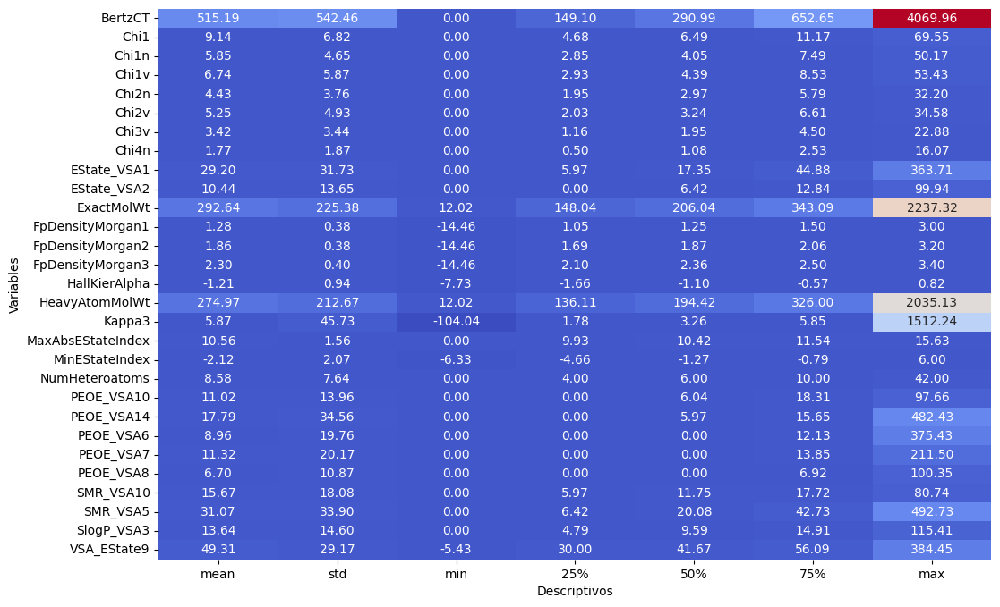

In [ ]:
estadisticas = train.drop('id', axis=1).describe().T
estadisticas.drop('count', axis=1, inplace=True)

plt.figure(figsize=(12, 8))
sns.heatmap(estadisticas, annot=True, fmt='.2f', cbar=False, cmap='coolwarm')
plt.xlabel('Descriptivos')
plt.ylabel('Variables')
#plt.tight_layout()
plt.show()

Existe un error seguramente en las variables FpDensity Morgan ya que el valor minimo es muy extremo.

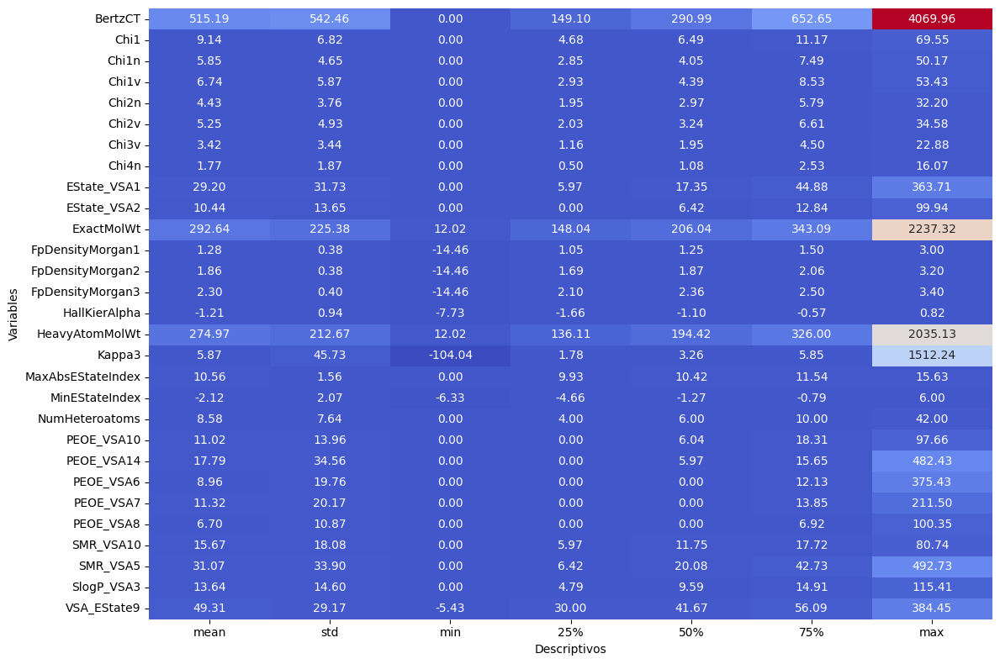

In [ ]:
train = train.loc[train.FpDensityMorgan2 != -666]
estadisticas = train.drop('id', axis=1).describe().T
estadisticas.drop('count', axis=1, inplace=True)

plt.figure(figsize=(12, 8))
sns.heatmap(estadisticas, annot=True, fmt='.2f', cbar=False, cmap='coolwarm')
plt.xlabel('Descriptivos')
plt.ylabel('Variables')
plt.tight_layout()
plt.show()

In [ ]:
def histogram_boxplot(data, xlabel = None, title = None, font_scale=2, figsize=(9,8), bins = None):
    """ Boxplot and histogram combined
    data: 1-d data array
    xlabel: xlabel
    title: title
    font_scale: the scale of the font (default 2)
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)

    example use: histogram_boxplot(np.random.rand(100), bins = 20, title="Fancy plot")
    """
    # Definir tamaño letra
    sns.set(font_scale=font_scale)
    # Crear ventana para los subgráficos
    f2, (ax_box2, ax_hist2) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=figsize)
    # Crear boxplot
    sns.boxplot(x=data, ax=ax_box2)
    # Crear histograma
    sns.histplot(x=data, ax=ax_hist2, bins=bins) if bins else sns.histplot(x=data, ax=ax_hist2)
    # Pintar una línea con la media
    ax_hist2.axvline(np.mean(data),color='g',linestyle='-')
    # Pintar una línea con la mediana
    ax_hist2.axvline(np.median(data),color='y',linestyle='--')
    # Asignar título y nombre de eje si tal
    if xlabel: ax_hist2.set(xlabel=xlabel)
    if title: ax_box2.set(title=title, xlabel="")
    # Mostrar gráfico
    plt.show()

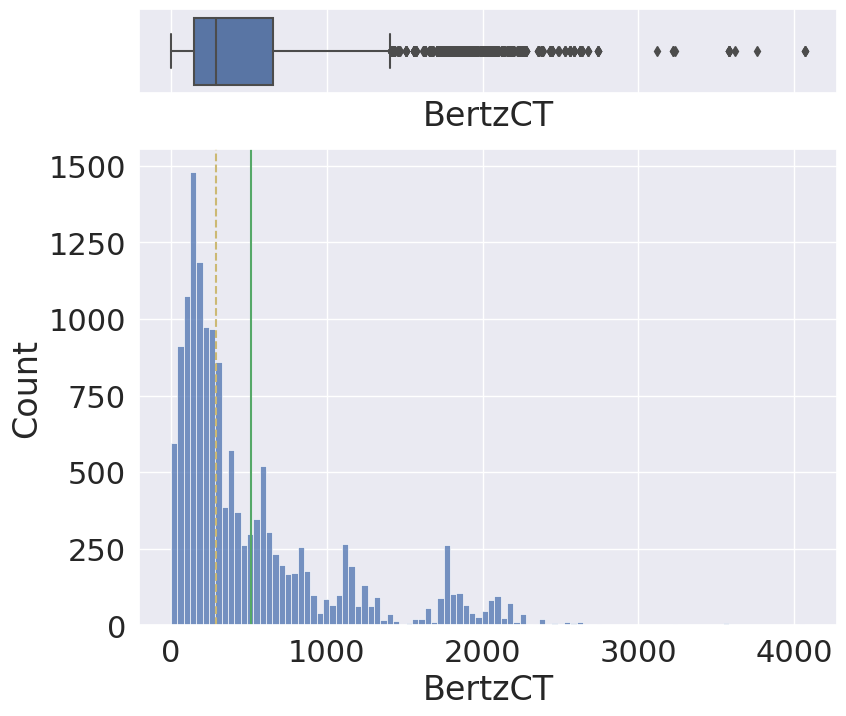

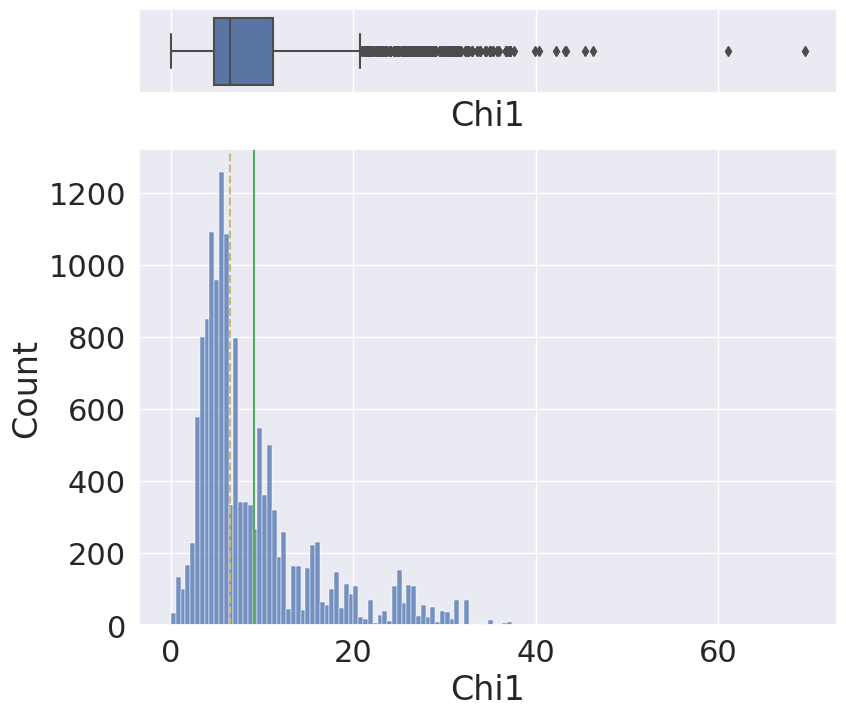

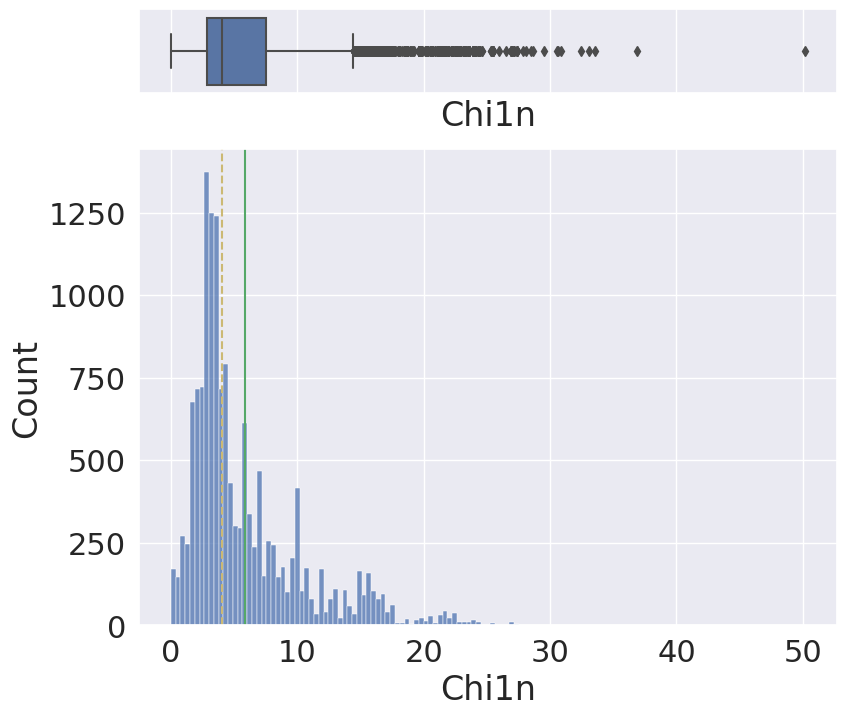

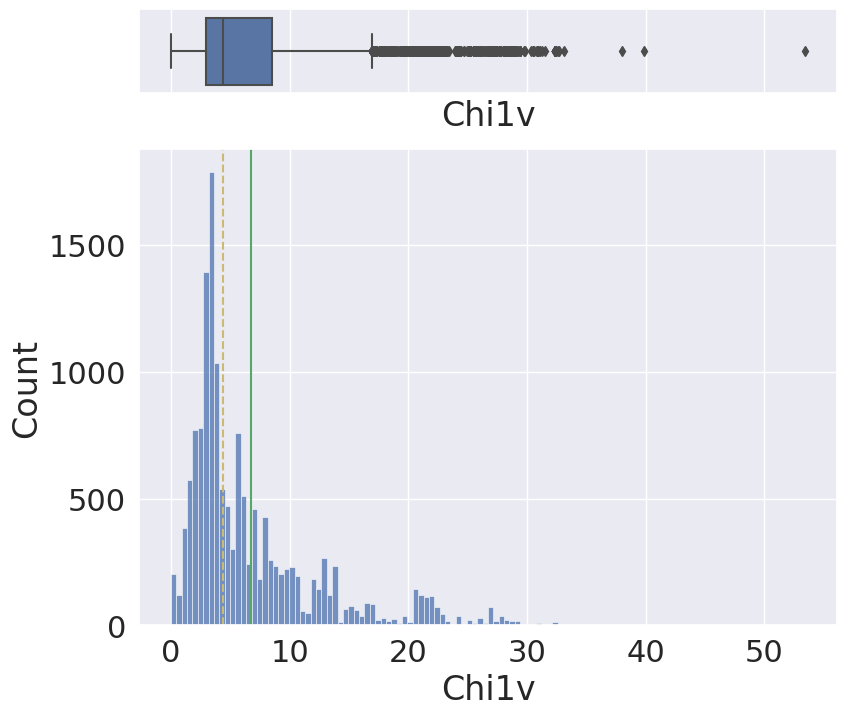

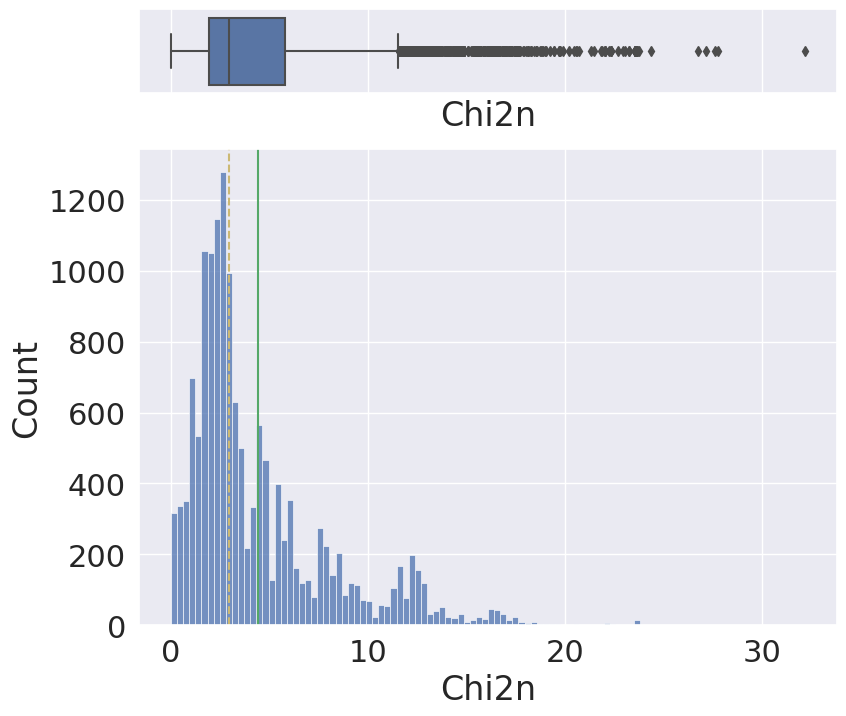

...

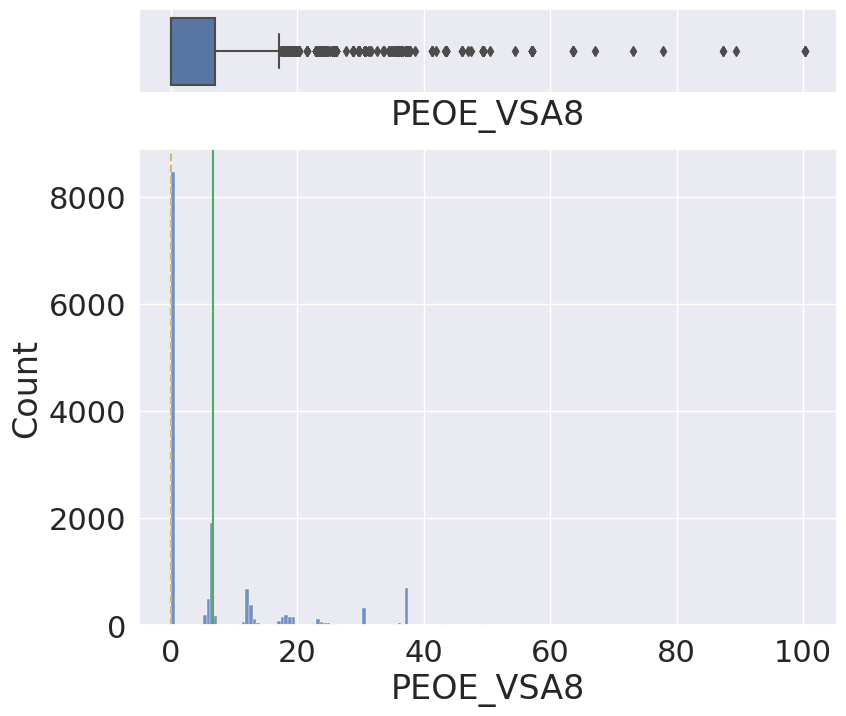

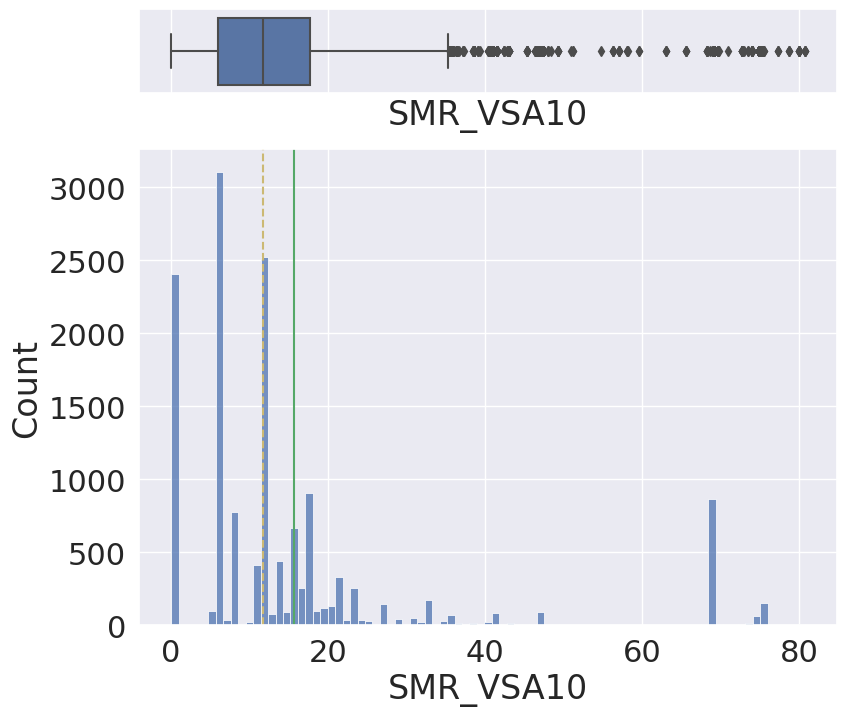

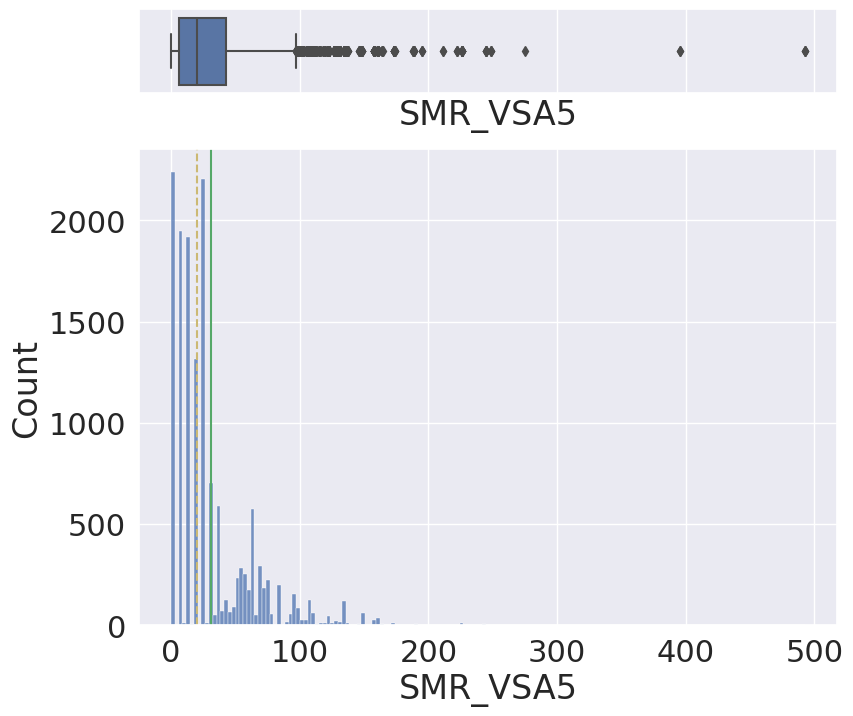

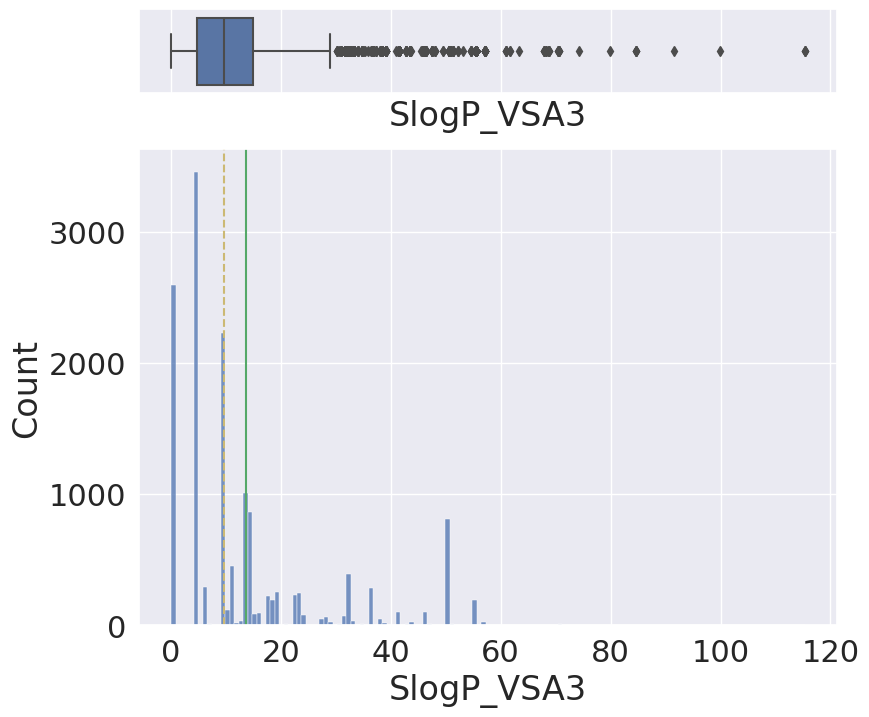

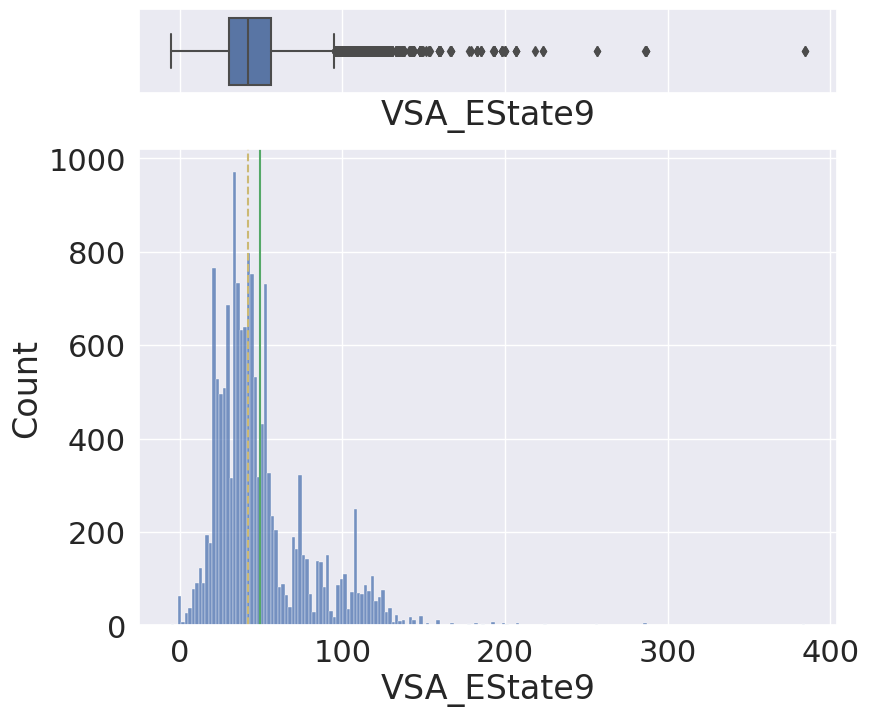

BertzCT              None
Chi1                 None
Chi1n                None
Chi1v                None
Chi2n                None
Chi2v                None
Chi3v                None
Chi4n                None
EState_VSA1          None
EState_VSA2          None
ExactMolWt           None
FpDensityMorgan1     None
FpDensityMorgan2     None
FpDensityMorgan3     None
HallKierAlpha        None
HeavyAtomMolWt       None
Kappa3               None
MaxAbsEStateIndex    None
MinEStateIndex       None
NumHeteroatoms       None
PEOE_VSA10           None
PEOE_VSA14           None
PEOE_VSA6            None
PEOE_VSA7            None
PEOE_VSA8            None
SMR_VSA10            None
SMR_VSA5             None
SlogP_VSA3           None
VSA_EState9          None
dtype: object

In [ ]:
train.select_dtypes(include=np.number).apply(histogram_boxplot)

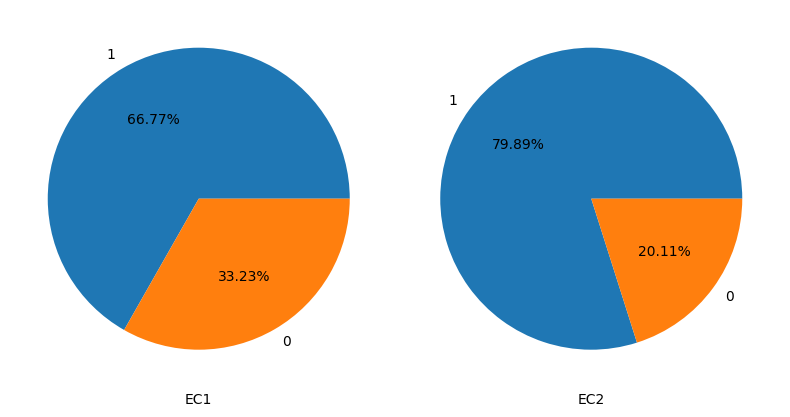

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 6))
ec1_counts = train['EC1'].value_counts()
labels_ec1 = ec1_counts.index
sizes_ec1 = ec1_counts.values
axes[0].pie(sizes_ec1, labels=labels_ec1, autopct='%1.2f%%')
axes[0].set_xlabel('EC1')

# Gráfico de torta para EC2
ec2_counts = train['EC2'].value_counts()
labels_ec2 = ec2_counts.index
sizes_ec2 = ec2_counts.values
axes[1].pie(sizes_ec2, labels=labels_ec2, autopct='%1.2f%%')
axes[1].set_xlabel('EC2')

plt.tight_layout()
plt.show()

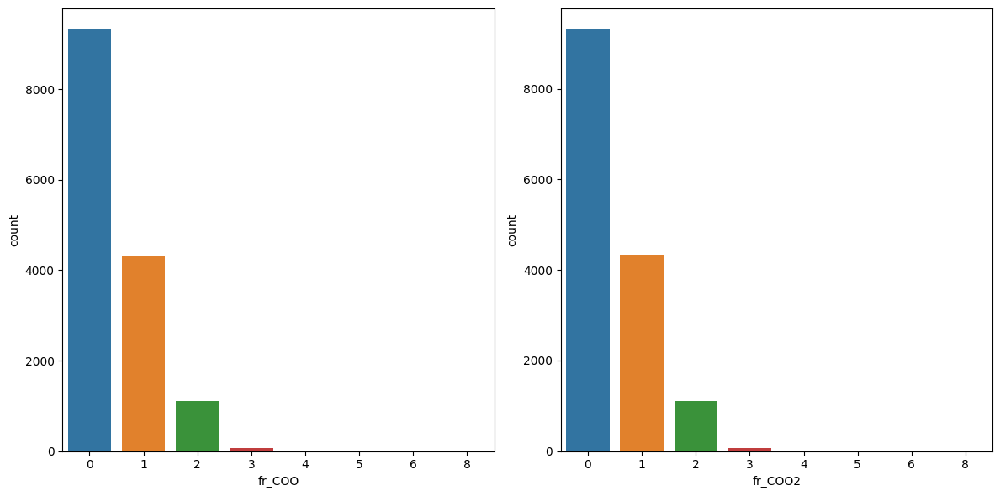

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
sns.countplot(data=train, x=train['fr_COO'], ax=axes[0])
axes[0].set_xlabel('fr_COO')
sns.countplot(data=train, x=train['fr_COO2'], ax=axes[1])
axes[1].set_xlabel('fr_COO2')
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

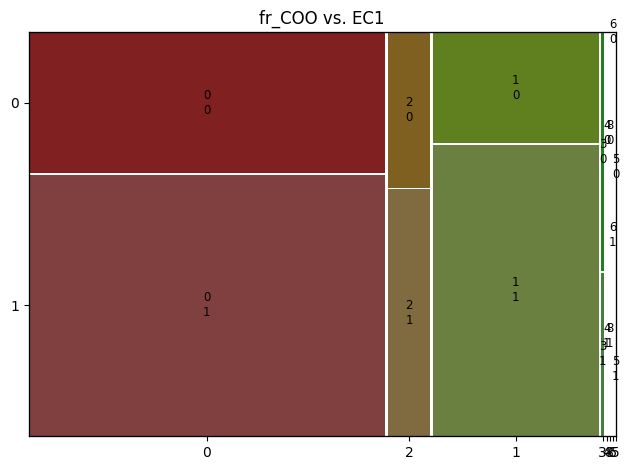

In [ ]:
from statsmodels.graphics.mosaicplot import mosaic
plt.clf()
mosaic(train,['fr_COO','EC1'],gap=0.005, title='fr_COO vs. EC1')
plt.tight_layout()
plt.show();

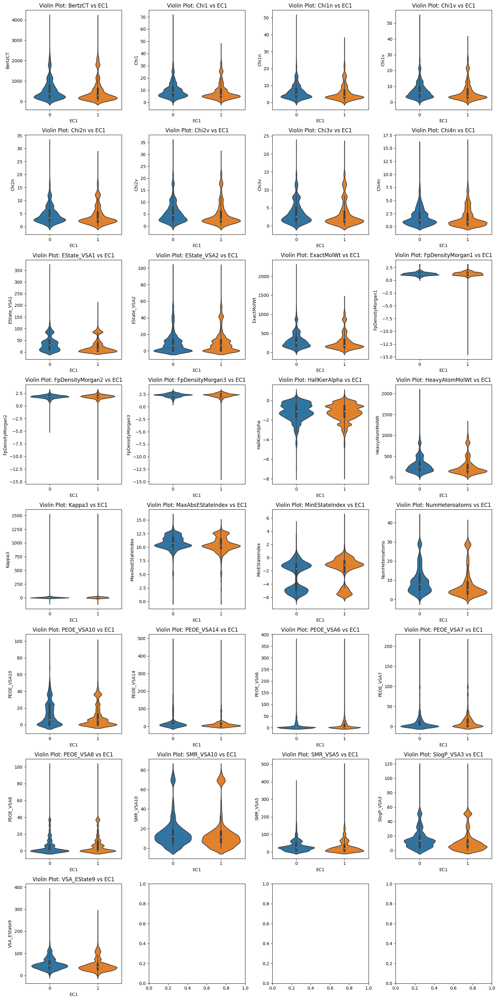

In [ ]:
train_columns = train.drop('id', axis=1).select_dtypes(include=np.number)
fig, axes = plt.subplots(8, 4, figsize=(16,32))
axes = axes.flatten()

for i, var in enumerate(train_columns):
    sns.violinplot(data=train, x="EC1", y=var, ax=axes[i])
    axes[i].set_xlabel("EC1")
    axes[i].set_ylabel(var)
    axes[i].set_title(f"Violin Plot: {var} vs EC1")

plt.tight_layout()
plt.show()

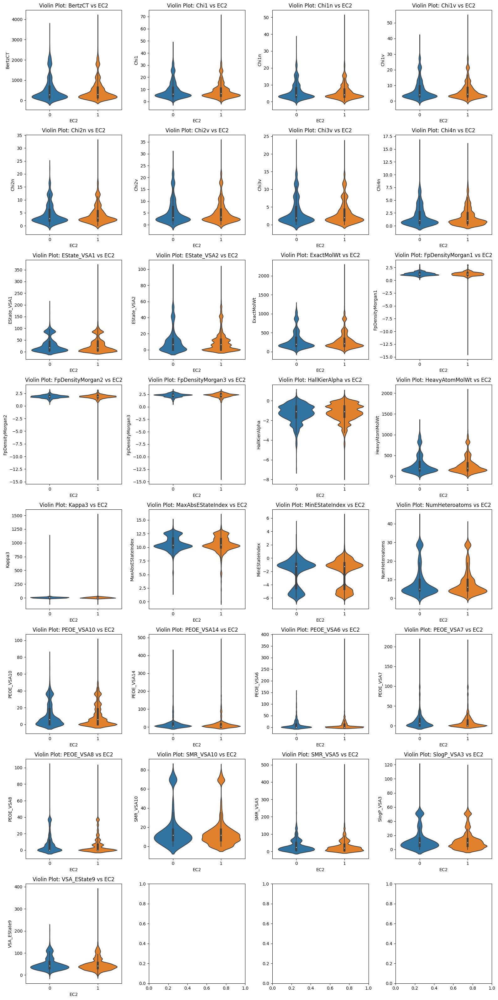

In [ ]:
train_columns = train.drop('id', axis=1).select_dtypes(include=np.number)
fig, axes = plt.subplots(8, 4, figsize=(16,32))
axes = axes.flatten()

for i, var in enumerate(train_columns):
    sns.violinplot(data=train, x="EC2", y=var, ax=axes[i])
    axes[i].set_xlabel("EC2")
    axes[i].set_ylabel(var)
    axes[i].set_title(f"Violin Plot: {var} vs EC2")

plt.tight_layout()
plt.show()

In [ ]:
from scipy import stats

def cramers_v(var1, varObj):
    if var1.dtypes == 'int64' or var1.dtypes =='float64':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
        data = pd.crosstab(var1, varObj).values


    else:
        data = pd.crosstab(var1, varObj).values

    vCramer = stats.contingency.association(data, method = 'cramer')

    return vCramer

In [ ]:
tablaCramer = pd.DataFrame(train.drop(['id','EC1'], axis=1).apply(lambda x: cramers_v(x,train.EC1)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a EC1').update_yaxes(categoryorder="total ascending").show()

In [ ]:
tablaCramer = pd.DataFrame(train.drop(['id','EC2'], axis=1).apply(lambda x: cramers_v(x,train.EC2)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a EC2').update_yaxes(categoryorder="total ascending").show()

In [ ]:
# Busca la transformación de variables input de intervalo que maximiza la VCramer o
# la correlación tipo Pearson con la objetivo
from sklearn.preprocessing import scale

def mejorTransf (vv,target, name=False, tipo = 'cramer', graf=False):

    # Escalado de datos (evitar fallos de tamaño de float64 al hacer exp de número grande..cosas de python)
    vv = pd.Series(scale(vv), name=vv.name)
    # Traslación a valores positivos de la variable (sino falla log y las raíces!)
    vv = vv + abs(min(vv))+0.0001

    # Definimos y calculamos las tranformacione típicas
    transf = pd.DataFrame({vv.name + '_ident': vv, vv.name + '_log': np.log(vv), vv.name + '_exp': np.exp(vv),
                         vv.name + '_sqr': np.square(vv), vv.name + '_cuarta': vv**4, vv.name + '_raiz4': vv**(1/4)})

    # Distinguimos caso cramer o caso correlación
    if tipo == 'cramer':
      # Aplicar la función cramers_v a cada trasnformación frente a la respuesta
      tablaCramer = pd.DataFrame(transf.apply(lambda x: cramers_v(x,target)),columns=['VCramer'])

      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # Identificar mejor transfromación
      best = tablaCramer.query('VCramer == VCramer.max()').index
      ser = transf[best[0]].squeeze()

    if tipo == 'cor':
      # Aplicar coeficiente de correlacion a cada trasnformación frente a la respuesta
      tablaCorr = pd.DataFrame(transf.apply(lambda x: np.corrcoef(x,target)[0,1]),columns=['Corr'])
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCorr,x=tablaCorr.Corr,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # identificar mejor transfromación
      best = tablaCorr.query('Corr.abs() == Corr.abs().max()').index
      ser = transf[best[0]].squeeze()

    # Aquí distingue si se devuelve la variable transfromada o solamente el nombre de la transfromacion
    if name:
      return(ser.name)
    else:
      return(ser)

In [ ]:
id_train = train['id']
train.drop('id', axis=1, inplace=True)

In [ ]:
categories = train.select_dtypes(exclude=np.number).columns.to_list()
numericas = train.select_dtypes(include=np.number).columns.to_list()
train[categories].head(2)

,fr_COO,fr_COO2,EC1,EC2
0,0,0,1,1
1,0,0,0,1


In [ ]:
print(numericas)

['BertzCT', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3v', 'Chi4n', 'EState_VSA1', 'EState_VSA2', 'ExactMolWt', 'FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3', 'HallKierAlpha', 'HeavyAtomMolWt', 'Kappa3', 'MaxAbsEStateIndex', 'MinEStateIndex', 'NumHeteroatoms', 'PEOE_VSA10', 'PEOE_VSA14', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'SMR_VSA10', 'SMR_VSA5', 'SlogP_VSA3', 'VSA_EState9']


Prueba Transformadas

In [ ]:
# Aplicar a las variables continuas la mejor transfromación según cramer frente a varObjBin
transf_cramer = train.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,train.EC1, tipo='cramer'))
transf_cramer_names = train.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,train.EC1,tipo='cramer', name=True))
transf_cramer.columns = transf_cramer_names.values
transf_cramer.head()

,BertzCT_log,Chi1_log,Chi1n_raiz4,Chi1v_log,Chi2n_raiz4,Chi2v_raiz4,Chi3v_raiz4,Chi4n_log,EState_VSA1_raiz4,EState_VSA2_raiz4,ExactMolWt_raiz4,FpDensityMorgan1_cuarta,FpDensityMorgan2_exp,FpDensityMorgan3_exp,HallKierAlpha_cuarta,HeavyAtomMolWt_log,Kappa3_ident,MaxAbsEStateIndex_cuarta,MinEStateIndex_ident,NumHeteroatoms_raiz4,PEOE_VSA10_log,PEOE_VSA14_raiz4,PEOE_VSA6_log,PEOE_VSA7_raiz4,PEOE_VSA8_cuarta,SMR_VSA10_raiz4,SMR_VSA5_raiz4,SlogP_VSA3_log,VSA_EState9_log
0,-0.517048,0.370776,1.060431,0.001700,1.034403,0.966943,0.946256,-0.064445,0.100000,0.967056,0.982575,2.815793e+06,5.214847e+18,1.233519e+18,4113.554585,-0.060578,2.453839,3438.957922,3.145321,0.850575,-9.210340,1.275719,-9.210340,0.100000,1.000000e-16,0.995351,0.100000,-1.113111,0.339406
1,-0.683760,0.062544,0.988790,-0.005237,0.966810,0.976921,0.894693,-0.369100,1.092137,0.100000,1.024239,2.936016e+06,1.323054e+19,3.367728e+18,4453.105684,0.100005,2.345191,2431.146969,0.724600,1.069510,0.559190,0.689826,-9.210340,0.100000,1.000000e-16,0.811085,0.975621,-0.054261,0.541625
2,-0.038988,0.470064,1.163931,0.633358,1.153863,1.179133,1.141066,-0.052300,0.838028,0.834114,1.132047,2.747220e+06,5.435799e+18,1.349748e+18,3049.515868,0.475404,2.603935,2714.700497,0.610483,1.041709,-9.210340,0.820300,-9.210340,1.275473,1.000000e-16,0.964520,1.212029,0.207584,0.560449
3,0.045138,0.602247,1.111390,0.782917,1.145672,1.221908,1.231955,0.497108,1.317659,0.100000,1.231325,2.802116e+06,3.465225e+18,9.788960e+17,2234.279297,0.843067,2.422226,2650.654756,0.508699,1.255653,1.118781,0.886428,-9.210340,0.100000,1.220375e-01,0.964520,1.163471,0.783699,1.158782
4,-1.570240,-0.434699,0.886251,-0.716000,0.840431,0.785628,0.741151,-0.941371,0.867680,0.984851,0.828260,3.009737e+06,1.449148e+19,1.984005e+18,2525.497373,-0.794761,2.361150,1605.901128,2.251044,0.850575,-0.837161,0.766694,-1.048246,0.990174,1.000000e-16,0.901481,0.863980,-0.420116,0.284354


In [ ]:
transf_cramer_EC2 = train.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,train.EC2, tipo='cramer'))
transf_cramer_names_EC2 = train.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,train.EC2,tipo='cramer', name=True))
transf_cramer_EC2.columns = transf_cramer_names_EC2.values
transf_cramer_EC2.head()

,BertzCT_ident,Chi1_sqr,Chi1n_raiz4,Chi1v_ident,Chi2n_cuarta,Chi2v_sqr,Chi3v_ident,Chi4n_ident,EState_VSA1_raiz4,EState_VSA2_sqr,ExactMolWt_ident,FpDensityMorgan1_sqr,FpDensityMorgan2_cuarta,FpDensityMorgan3_cuarta,HallKierAlpha_raiz4,HeavyAtomMolWt_ident,Kappa3_ident,MaxAbsEStateIndex_raiz4,MinEStateIndex_raiz4,NumHeteroatoms_exp,PEOE_VSA10_ident,PEOE_VSA14_log,PEOE_VSA6_ident,PEOE_VSA7_ident,PEOE_VSA8_sqr,SMR_VSA10_sqr,SMR_VSA5_log,SlogP_VSA3_log,VSA_EState9_ident
0,0.596278,2.099190,1.060431,1.001701,1.718058,0.764198,0.801741,0.937588,0.100000,7.649165e-01,0.932100,1678.032512,3.450088e+06,3.011113e+06,1.682242,0.941220,2.453839,1.663515,1.331730,1.687789,0.000100,0.974038,0.000100,0.000100,1.000000e-08,0.963407,-9.210340,-1.113111,1.404114
1,0.504716,1.133248,0.988790,0.994777,0.582715,0.829612,0.640762,0.691356,1.092137,1.000000e-08,1.100541,1713.480554,3.758007e+06,3.312186e+06,1.690602,1.105176,2.345191,1.627846,0.922624,3.700243,1.749254,-1.485266,0.000100,0.000100,1.000000e-08,0.187296,-0.098723,-0.054261,1.718797
2,0.961762,2.560311,1.163931,1.883925,9.873382,3.736813,1.695287,0.949044,0.838028,2.343164e-01,1.642319,1657.474106,3.463395e+06,3.037234e+06,1.651066,1.608663,2.603935,1.639108,0.883931,3.246471,0.000100,-0.792340,0.000100,2.646579,1.000000e-08,0.749012,0.769184,0.207584,1.751459
3,1.046172,3.335068,1.111390,2.187844,8.809723,4.969432,2.303455,1.643960,1.317659,1.000000e-08,2.298743,1673.952120,3.321058e+06,2.944818e+06,1.619277,2.323481,2.422226,1.636664,0.844530,12.011531,3.061120,-0.482220,0.000100,0.000100,3.493387e-01,0.749012,0.605631,0.783699,3.186049
4,0.207995,0.419204,0.886251,0.488703,0.061949,0.145122,0.301736,0.390093,0.867680,8.850417e-01,0.470617,1734.859414,3.789184e+06,3.150894e+06,1.631724,0.451689,2.361150,1.586198,1.224887,1.687789,0.432938,-1.062670,0.350552,0.961273,1.000000e-08,0.436168,-0.584820,-0.420116,1.328904


In [ ]:
train['fr_COO'] = np.where(train['fr_COO'] != 0, 1, 0)
train['fr_COO2'] = np.where(train['fr_COO2'] != 0, 1, 0)
display(train.fr_COO.value_counts())
display(train.fr_COO2.unique())

0    9324
1    5513
Name: fr_COO, dtype: int64

array([0, 1])

In [ ]:
train['fr_COO'] = train['fr_COO'].astype('category')
train['fr_COO2'] = train['fr_COO2'].astype('category')
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14837 entries, 0 to 14837
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   BertzCT            14837 non-null  float64 
 1   Chi1               14837 non-null  float64 
 2   Chi1n              14837 non-null  float64 
 3   Chi1v              14837 non-null  float64 
 4   Chi2n              14837 non-null  float64 
 5   Chi2v              14837 non-null  float64 
 6   Chi3v              14837 non-null  float64 
 7   Chi4n              14837 non-null  float64 
 8   EState_VSA1        14837 non-null  float64 
 9   EState_VSA2        14837 non-null  float64 
 10  ExactMolWt         14837 non-null  float64 
 11  FpDensityMorgan1   14837 non-null  float64 
 12  FpDensityMorgan2   14837 non-null  float64 
 13  FpDensityMorgan3   14837 non-null  float64 
 14  HallKierAlpha      14837 non-null  float64 
 15  HeavyAtomMolWt     14837 non-null  float64 
 16  Kapp

In [ ]:
transformadas_EC1 = pd.concat([transf_cramer, train[categories]], axis=1)
transformadas_EC2 = pd.concat([transf_cramer_EC2, train[categories]], axis=1)

In [ ]:
# the scaler - for min-max scaling
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
#variables to scale
vars = train.select_dtypes(include=np.number).columns.to_list()

# Define el transformador para las columnas seleccionadas
transformer = ColumnTransformer(
    transformers=[
        ('scaling', MinMaxScaler(), vars)
    ],
    remainder='passthrough'  # Las columnas no seleccionadas se pasan sin cambios
)

In [ ]:
df_train = transformer.fit_transform(train)

df_train = pd.DataFrame(df_train, columns=train.columns)

df_train.head()

,BertzCT,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3v,Chi4n,EState_VSA1,EState_VSA2,ExactMolWt,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,HallKierAlpha,HeavyAtomMolWt,Kappa3,MaxAbsEStateIndex,MinEStateIndex,NumHeteroatoms,PEOE_VSA10,PEOE_VSA14,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,SMR_VSA10,SMR_VSA5,SlogP_VSA3,VSA_EState9,fr_COO,fr_COO2,EC1,EC2
0,0.079458,0.142053,0.117103,0.109964,0.133707,0.124489,0.120385,0.10883,0.0,0.119459,0.09439,0.895857,0.916599,0.941968,0.876023,0.098929,0.069425,0.762784,0.527203,0.095238,0.0,0.189739,0.0,0.0,0.0,0.219762,0.0,0.041545,0.105052,0,0,1,1
1,0.067255,0.10437,0.08852,0.109204,0.102035,0.129709,0.09621,0.080246,0.124099,0.0,0.111449,0.90527,0.9364,0.96468,0.893567,0.116164,0.066351,0.699435,0.121441,0.238095,0.25,0.016215,0.0,0.0,0.0,0.096885,0.062318,0.1198,0.128598,0,0,0,1
2,0.128169,0.156882,0.169964,0.206821,0.207026,0.275301,0.254572,0.11016,0.043017,0.066111,0.166319,0.890352,0.917482,0.944004,0.812865,0.16909,0.073671,0.718993,0.102313,0.214286,0.0,0.03243,0.0,0.252378,0.0,0.19377,0.148446,0.155663,0.131042,0,0,1,1
3,0.139419,0.179053,0.141289,0.240188,0.20121,0.317477,0.345903,0.19083,0.262958,0.0,0.2328,0.894767,0.907907,0.93674,0.752047,0.24423,0.06853,0.714715,0.085251,0.452381,0.4375,0.044224,0.0,0.0,0.063985,0.19377,0.126047,0.276952,0.238382,0,0,1,1
4,0.027708,0.063474,0.057125,0.053643,0.058258,0.054242,0.045298,0.045273,0.049437,0.128498,0.047653,0.9109,0.938336,0.952715,0.775439,0.04747,0.066802,0.630555,0.377304,0.095238,0.061864,0.024747,0.018442,0.091661,0.0,0.147861,0.038324,0.08309,0.099425,1,1,1,0


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14837 entries, 0 to 14836
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   BertzCT            14837 non-null  object
 1   Chi1               14837 non-null  object
 2   Chi1n              14837 non-null  object
 3   Chi1v              14837 non-null  object
 4   Chi2n              14837 non-null  object
 5   Chi2v              14837 non-null  object
 6   Chi3v              14837 non-null  object
 7   Chi4n              14837 non-null  object
 8   EState_VSA1        14837 non-null  object
 9   EState_VSA2        14837 non-null  object
 10  ExactMolWt         14837 non-null  object
 11  FpDensityMorgan1   14837 non-null  object
 12  FpDensityMorgan2   14837 non-null  object
 13  FpDensityMorgan3   14837 non-null  object
 14  HallKierAlpha      14837 non-null  object
 15  HeavyAtomMolWt     14837 non-null  object
 16  Kappa3             14837 non-null  objec

In [ ]:
df_train[numericas] = df_train[numericas].astype('float64')

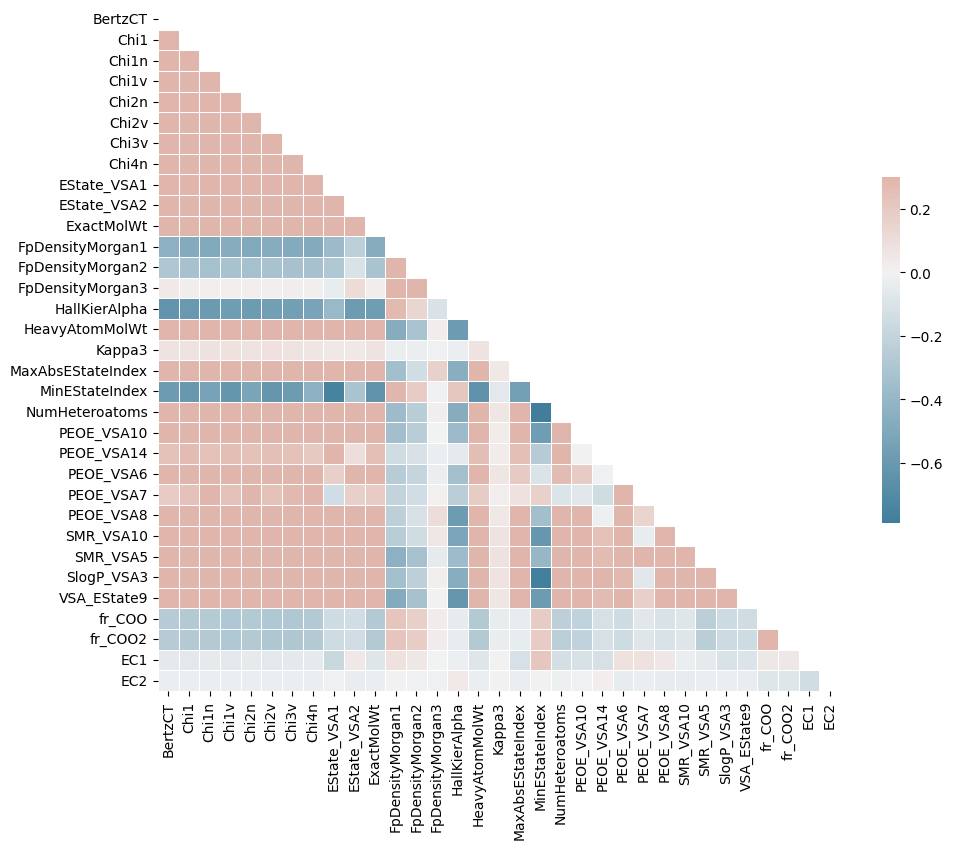

In [ ]:
 # Calculate the correlation matrix
df_train[categories] = df_train[categories].astype(int)
corr = df_train.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14837 entries, 0 to 14836
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   BertzCT            14837 non-null  float64
 1   Chi1               14837 non-null  float64
 2   Chi1n              14837 non-null  float64
 3   Chi1v              14837 non-null  float64
 4   Chi2n              14837 non-null  float64
 5   Chi2v              14837 non-null  float64
 6   Chi3v              14837 non-null  float64
 7   Chi4n              14837 non-null  float64
 8   EState_VSA1        14837 non-null  float64
 9   EState_VSA2        14837 non-null  float64
 10  ExactMolWt         14837 non-null  float64
 11  FpDensityMorgan1   14837 non-null  float64
 12  FpDensityMorgan2   14837 non-null  float64
 13  FpDensityMorgan3   14837 non-null  float64
 14  HallKierAlpha      14837 non-null  float64
 15  HeavyAtomMolWt     14837 non-null  float64
 16  Kappa3             148

In [ ]:
df_targets = df_train[targets]
df_train.drop(['EC1', 'EC2'], axis=1, inplace=True)

In [ ]:
from sklearn.model_selection import train_test_split

X_train_EC1, X_test_EC1, y_train_EC1, y_test_EC1 = train_test_split(
    df_train,
    df_targets.EC1,
    test_size=0.25,
    random_state=0,
)

X_train_EC2, X_test_EC2, y_train_EC2, y_test_EC2 = train_test_split(
    df_train,
    df_targets.EC2,
    test_size=0.25,
    random_state=0,
)

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 11.1 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, learning_curve
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, precision_recall_curve, auc
from sklearn.decomposition import PCA
from sklearn.utils import resample
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import shap
from xgboost import XGBClassifier

**Logistic Regresion Model**

EC1

In [ ]:
modelo_lg = LogisticRegression(random_state=6).fit(X_train_EC1, y_train_EC1)
y_pred_lg = modelo_lg.predict(X_test_EC1)

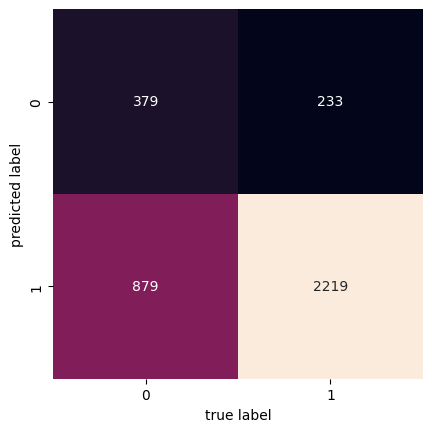

In [ ]:
mat_lg = confusion_matrix(y_test_EC1, y_pred_lg)
sns.heatmap(mat_lg.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_lg, y_test_EC1))

              precision    recall  f1-score   support

           0       0.30      0.62      0.41       612
           1       0.90      0.72      0.80      3098

    accuracy                           0.70      3710
   macro avg       0.60      0.67      0.60      3710
weighted avg       0.81      0.70      0.73      3710



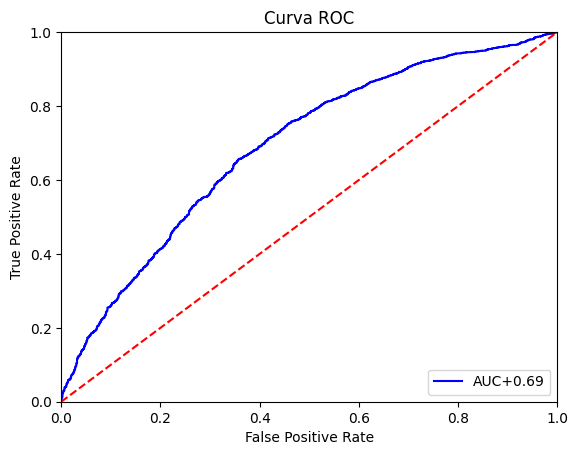

In [ ]:
predicciones = modelo_lg.predict_proba(X_test_EC1)
y_pred_lg = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC1, y_pred_lg)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

EC2

In [ ]:
modelo_lg2 = LogisticRegression(random_state=23).fit(X_train_EC2, y_train_EC2)
y_pred_lg2 = modelo_lg2.predict(X_test_EC2)

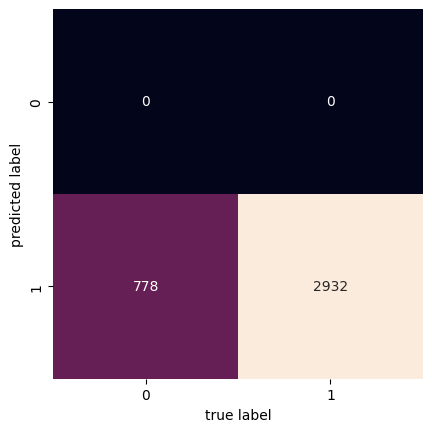

In [ ]:
mat_lg2 = confusion_matrix(y_test_EC2, y_pred_lg2)
sns.heatmap(mat_lg2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_lg2, y_test_EC2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.79      0.88      3710

    accuracy                           0.79      3710
   macro avg       0.50      0.40      0.44      3710
weighted avg       1.00      0.79      0.88      3710



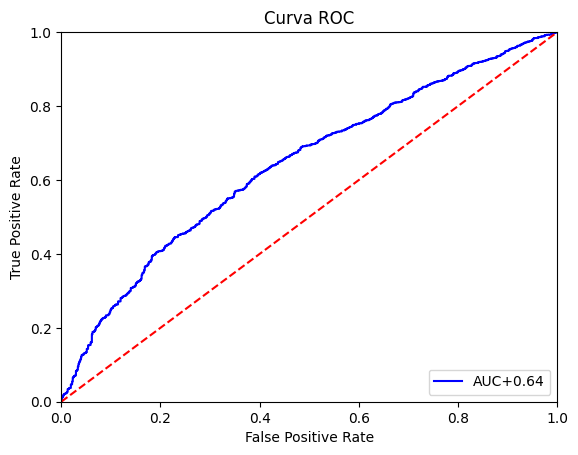

In [ ]:
predicciones = modelo_lg2.predict_proba(X_test_EC2)
y_pred_lg2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC2, y_pred_lg2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

**SMV Model**

EC1

In [ ]:
modelo_SMV = LinearSVC(random_state=6).fit(X_train_EC1, y_train_EC1)
y_pred_SMV = modelo_SMV.predict(X_test_EC1)

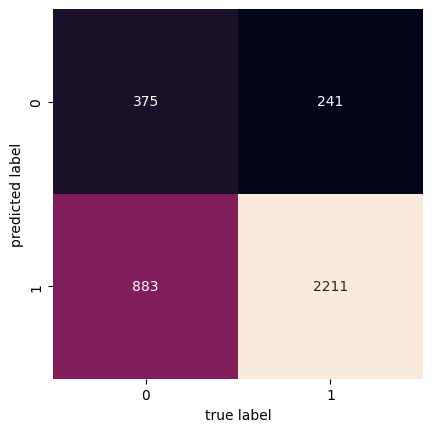

In [ ]:
mat_SMV = confusion_matrix(y_test_EC1, y_pred_SMV)
sns.heatmap(mat_SMV.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_SMV, y_test_EC1))

              precision    recall  f1-score   support

           0       0.30      0.61      0.40       616
           1       0.90      0.71      0.80      3094

    accuracy                           0.70      3710
   macro avg       0.60      0.66      0.60      3710
weighted avg       0.80      0.70      0.73      3710



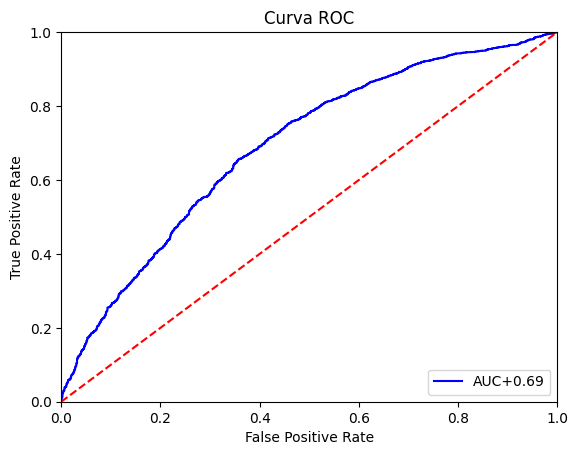

In [ ]:
predicciones = modelo_lg.predict_proba(X_test_EC1)
y_pred_SMV = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC1, y_pred_SMV)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

EC2

In [ ]:
modelo_SMV2 = LinearSVC(random_state=23).fit(X_train_EC2, y_train_EC2)
y_pred_SMV2 = modelo_SMV2.predict(X_test_EC2)

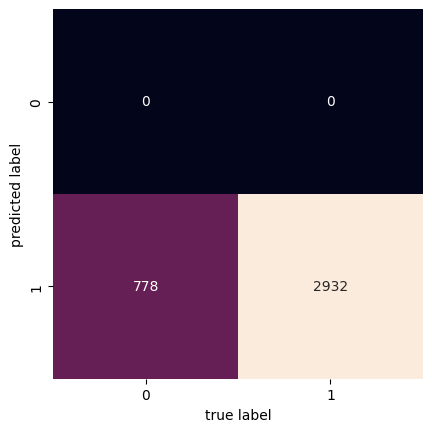

In [ ]:
mat_SMV2 = confusion_matrix(y_test_EC2, y_pred_SMV2)
sns.heatmap(mat_SMV2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_SMV2, y_test_EC2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.79      0.88      3710

    accuracy                           0.79      3710
   macro avg       0.50      0.40      0.44      3710
weighted avg       1.00      0.79      0.88      3710



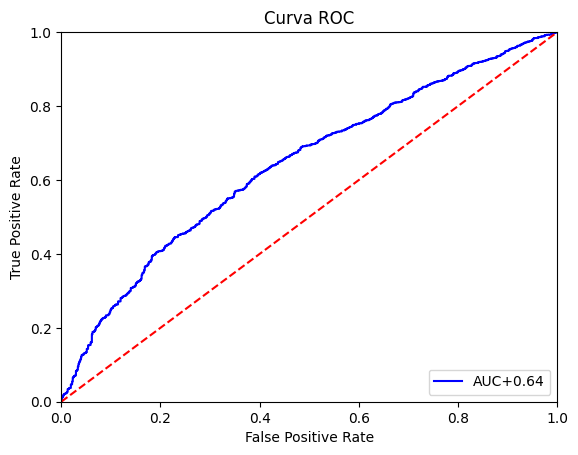

In [ ]:
predicciones = modelo_lg2.predict_proba(X_test_EC2)
y_pred_lg2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC2, y_pred_lg2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

**Decission Tree Model**

EC1

In [ ]:
modelo_DecisionTree = DecisionTreeClassifier().fit(X_train_EC1, y_train_EC1)
y_pred_EC1 = modelo_DecisionTree.predict(X_test_EC1)

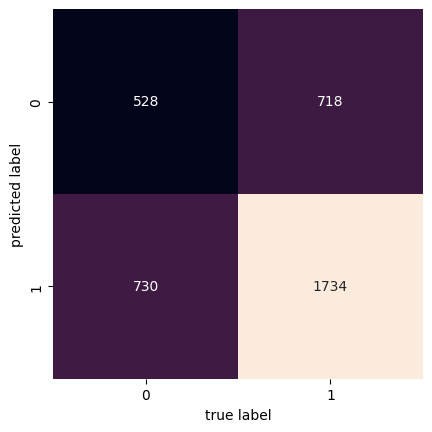

In [ ]:
mat_tree = confusion_matrix(y_test_EC1, y_pred_EC1)
sns.heatmap(mat_tree.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_EC1, y_test_EC1))

              precision    recall  f1-score   support

           0       0.42      0.42      0.42      1246
           1       0.71      0.70      0.71      2464

    accuracy                           0.61      3710
   macro avg       0.56      0.56      0.56      3710
weighted avg       0.61      0.61      0.61      3710



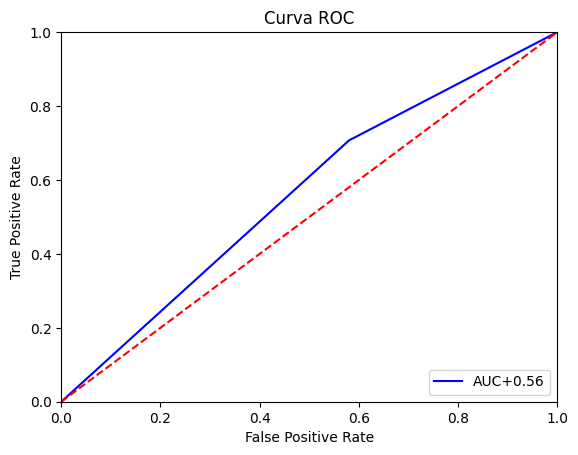

In [ ]:
predicciones = modelo_DecisionTree.predict_proba(X_test_EC1)
pred = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC1, pred)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

In [ ]:
EC2

In [ ]:
modelo_DeTree2 = DecisionTreeClassifier(random_state=23).fit(X_train_EC2, y_train_EC2)
y_pred_Detree2 = modelo_DeTree2.predict(X_test_EC2)

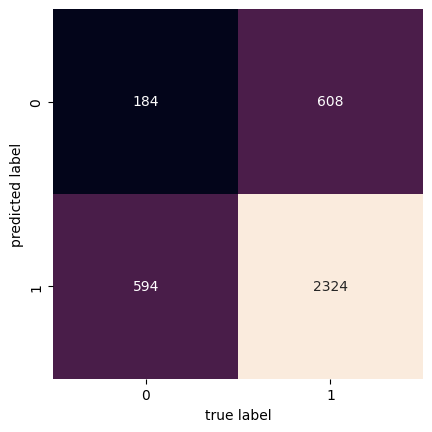

In [ ]:
mat_DeTree2 = confusion_matrix(y_test_EC2, y_pred_Detree2)
sns.heatmap(mat_DeTree2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_Detree2, y_test_EC2))

              precision    recall  f1-score   support

           0       0.24      0.23      0.23       792
           1       0.79      0.80      0.79      2918

    accuracy                           0.68      3710
   macro avg       0.51      0.51      0.51      3710
weighted avg       0.67      0.68      0.67      3710



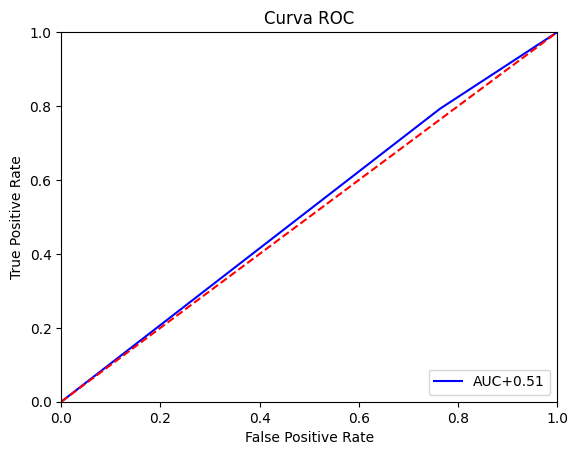

In [ ]:
predicciones = modelo_DeTree2.predict_proba(X_test_EC2)
y_pred_tree2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC2, y_pred_tree2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

**Random Forest**

EC1

In [ ]:
modelo_rforest = RandomForestClassifier(random_state=1).fit(X_train_EC1, y_train_EC1)
y_pred_rforest = modelo_rforest.predict(X_test_EC1)

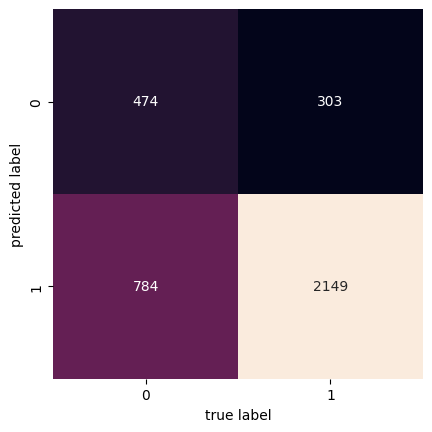

In [ ]:
mat_rforest = confusion_matrix(y_test_EC1, y_pred_rforest)
sns.heatmap(mat_rforest.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_rforest, y_test_EC1))

              precision    recall  f1-score   support

           0       0.38      0.61      0.47       777
           1       0.88      0.73      0.80      2933

    accuracy                           0.71      3710
   macro avg       0.63      0.67      0.63      3710
weighted avg       0.77      0.71      0.73      3710



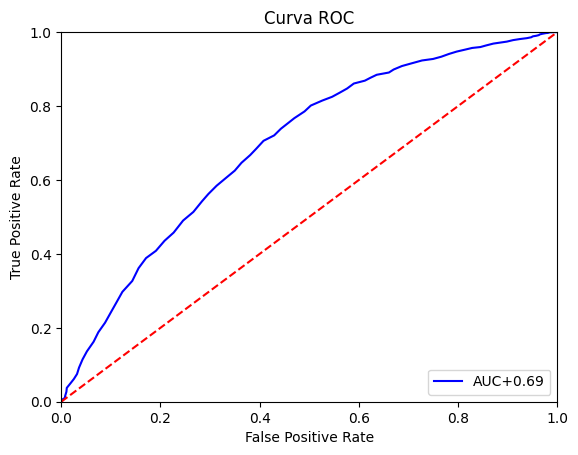

In [ ]:
predicciones = modelo_rforest.predict_proba(X_test_EC1)
pred_forest = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC1, pred_forest)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

EC2

In [ ]:
modelo_forest2 = RandomForestClassifier(random_state=2).fit(X_train_EC2, y_train_EC2)
y_pred_forest2 = modelo_forest2.predict(X_test_EC2)

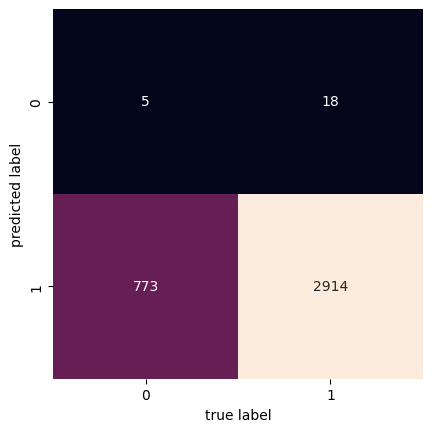

In [ ]:
mat_forest2 = confusion_matrix(y_test_EC2, y_pred_forest2)
sns.heatmap(mat_forest2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_forest2, y_test_EC2))

              precision    recall  f1-score   support

           0       0.01      0.22      0.01        23
           1       0.99      0.79      0.88      3687

    accuracy                           0.79      3710
   macro avg       0.50      0.50      0.45      3710
weighted avg       0.99      0.79      0.88      3710



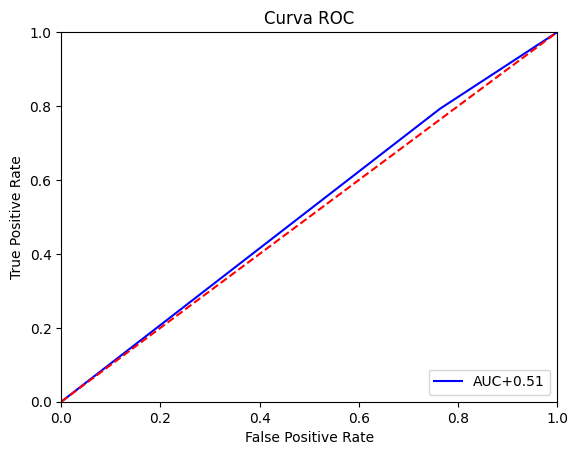

In [ ]:
predicciones = modelo_DeTree2.predict_proba(X_test_EC2)
pred_forest2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC2, pred_forest2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

Evaluacion Conjunta de Modelos

XGB
CV Accuracy: 0.69121 +/- 0.01619
-------------------------
RF
CV Accuracy: 0.68607 +/- 0.01483
-------------------------
Tree
CV Accuracy: 0.56598 +/- 0.01890
-------------------------
SMV
CV Accuracy: 0.67437 +/- 0.01631
-------------------------
AdaBoost
CV Accuracy: 0.69945 +/- 0.01482
-------------------------


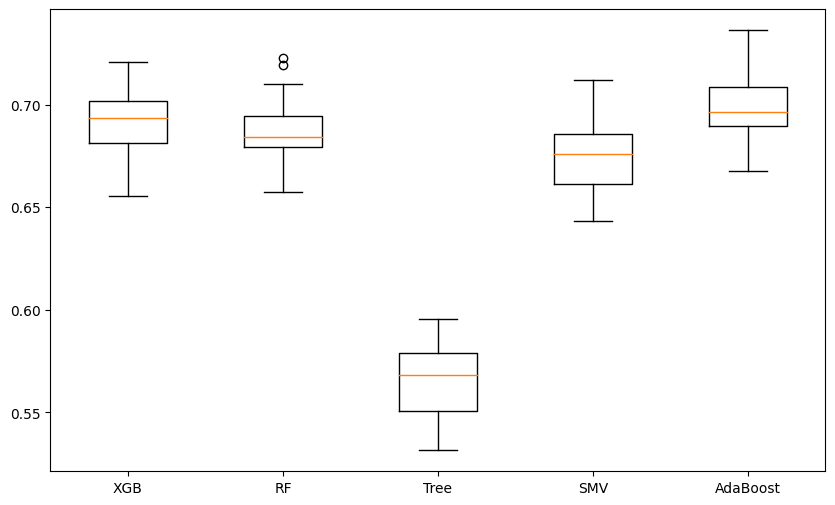

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
models_rcv = {
    "XGB": XGBClassifier(n_jobs=-1, n_estimators=30, random_state=1234),
    "RF": RandomForestClassifier(n_estimators =30, n_jobs=-1, random_state=1234),
    "Tree": DecisionTreeClassifier(random_state=1234),
    "SMV": LinearSVC(random_state=23),
    "AdaBoost": AdaBoostClassifier(random_state=345, n_estimators=30)

}

def rskf_comparison(models, X_train, y_train):

    results = []
    names = []

    for k, v in models.items():

        rskf = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1234)
        cv_scores = cross_val_score(v, X_train, y_train, scoring='roc_auc', cv=rskf, n_jobs=-1)

        results.append(cv_scores)
        names.append(k)

        print(k)
        print('CV Accuracy: %.5f +/- %.5f' % (np.mean(cv_scores), np.std(cv_scores)))
        print('-------------------------')


    return(results, names)


results, names = rskf_comparison(models_rcv, X_train_EC1, y_train_EC1)
plt.figure(figsize=(10, 6))
comparison = plt.boxplot(results)
plt.xticks(np.arange(1,len(names)+1),names)
plt.show(comparison)

XGB
CV Accuracy: 0.55742 +/- 0.02243
-------------------------
RF
CV Accuracy: 0.54766 +/- 0.01664
-------------------------
Tree
CV Accuracy: 0.51203 +/- 0.01417
-------------------------
SMV
CV Accuracy: 0.57198 +/- 0.01658
-------------------------
AdaBoost
CV Accuracy: 0.57928 +/- 0.01582
-------------------------


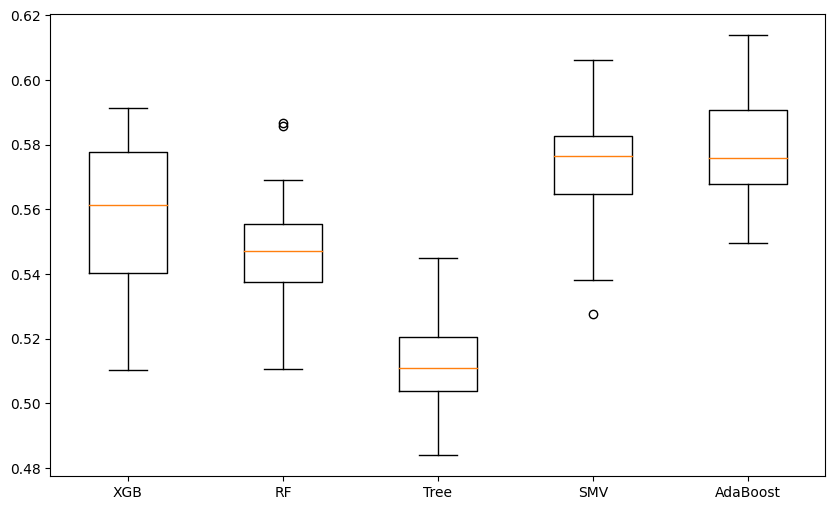

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
models_rcv = {
    "XGB": XGBClassifier(n_jobs=-1, n_estimators=30, random_state=1234),
    "RF": RandomForestClassifier(n_estimators =30, n_jobs=-1, random_state=1234),
    "Tree": DecisionTreeClassifier(random_state=1234),
    "SMV": LinearSVC(random_state=23),
    "AdaBoost": AdaBoostClassifier(random_state=345, n_estimators=30)

}

def rskf_comparison(models, X_train, y_train):

    results = []
    names = []

    for k, v in models.items():

        rskf = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1234)
        cv_scores = cross_val_score(v, X_train, y_train, scoring='roc_auc', cv=rskf, n_jobs=-1)

        results.append(cv_scores)
        names.append(k)

        print(k)
        print('CV Accuracy: %.5f +/- %.5f' % (np.mean(cv_scores), np.std(cv_scores)))
        print('-------------------------')


    return(results, names)


results, names = rskf_comparison(models_rcv, X_train_EC2, y_train_EC2)
plt.figure(figsize=(10, 6))
comparison = plt.boxplot(results)
plt.xticks(np.arange(1,len(names)+1),names)
plt.show(comparison)

In [ ]:
# Hyperparameter tuning with GridSearchCV
# This is just an example, you'll need to specify the parameters for your specific models
param_grid = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}

modelo_ganador_EC1 = AdaBoostClassifier(random_state=345)

modelo_ganador_EC1 = GridSearchCV(modelo_ganador_EC1, param_grid, cv=10, scoring='roc_auc')
modelo_ganador_EC1.fit(df_train, df_targets.EC1)
print("Mejores Parametros para el modelo Ganador: ", modelo_ganador_EC1.best_params_)

Mejores Parametros para el modelo Ganador:  {'learning_rate': 0.1, 'n_estimators': 200}


In [ ]:
modelo_ganador_EC1_v2 = AdaBoostClassifier(random_state=345)
param_grid2 = {'n_estimators': [200, 250, 300, 400], 'learning_rate': [0.1]}
modelo_ganador_EC1_v2 = GridSearchCV(modelo_ganador_EC1_v2, param_grid2, cv=10, scoring='roc_auc')
modelo_ganador_EC1_v2.fit(df_train, df_targets.EC1)
print("Mejores Parametros para el modelo Ganador: ", modelo_ganador_EC1_v2.best_params_)

Mejores Parametros para el modelo Ganador:  {'learning_rate': 0.1, 'n_estimators': 200}


In [ ]:
param_grid = {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}

modelo_ganador_EC2 = AdaBoostClassifier(random_state=345)

modelo_ganador_EC2 = GridSearchCV(modelo_ganador_EC2, param_grid, cv=10, scoring='roc_auc')
modelo_ganador_EC2.fit(df_train, df_targets.EC2)
print("Mejores Parametros para el modelo Ganador: ", modelo_ganador_EC2.best_params_)

Mejores Parametros para el modelo Ganador:  {'learning_rate': 0.1, 'n_estimators': 200}


Modelos Ganadores Tuneados

In [ ]:
modelo_EC1 = AdaBoostClassifier(random_state=345, learning_rate=0.1, n_estimators=200)
modelo_EC2 = AdaBoostClassifier(random_state=345, learning_rate=0.1, n_estimators=200)

In [ ]:
modelo_EC1.fit(X_train_EC1, y_train_EC1)
y_pred_EC1 = modelo_EC1.predict(X_test_EC1)

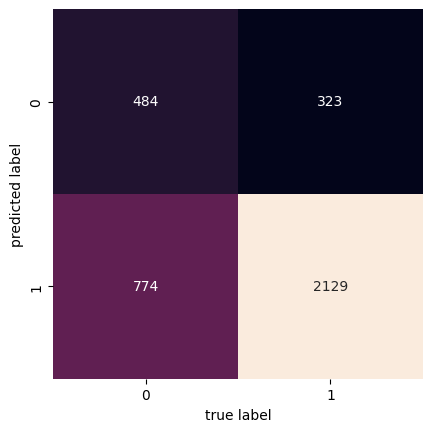

In [ ]:
mat_EC1 = confusion_matrix(y_test_EC1, y_pred_EC1)
sns.heatmap(mat_EC1.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_EC1, y_test_EC1))

              precision    recall  f1-score   support

           0       0.38      0.60      0.47       807
           1       0.87      0.73      0.80      2903

    accuracy                           0.70      3710
   macro avg       0.63      0.67      0.63      3710
weighted avg       0.76      0.70      0.72      3710



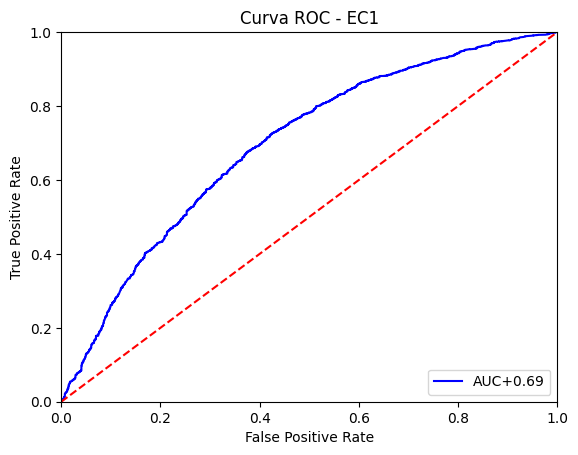

In [ ]:
predicciones = modelo_EC1.predict_proba(X_test_EC1)
pred_EC1 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC1, pred_EC1)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC - EC1')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

In [ ]:
modelo_EC2.fit(X_train_EC2, y_train_EC2)
y_pred_EC2 = modelo_EC2.predict(X_test_EC2)

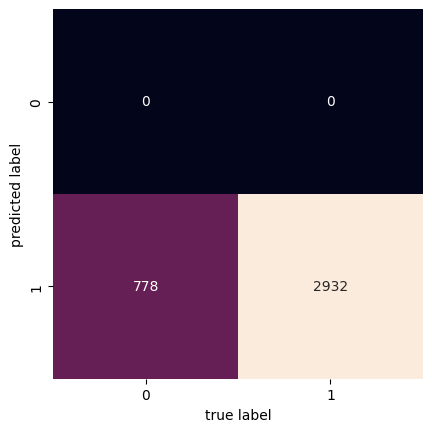

In [ ]:
mat_EC2 = confusion_matrix(y_test_EC2, y_pred_EC2)
sns.heatmap(mat_EC2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_EC2, y_test_EC2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.79      0.88      3710

    accuracy                           0.79      3710
   macro avg       0.50      0.40      0.44      3710
weighted avg       1.00      0.79      0.88      3710



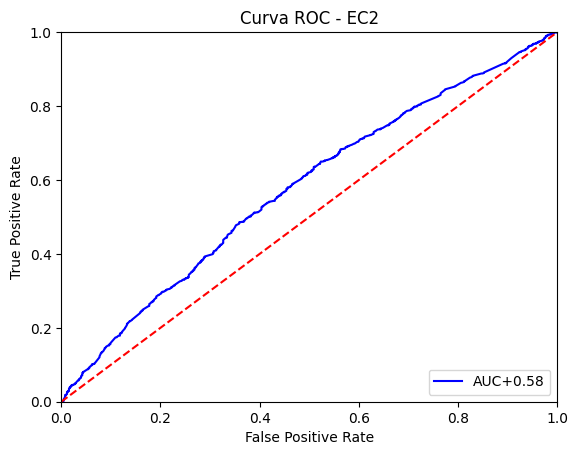

In [ ]:
predicciones = modelo_EC2.predict_proba(X_test_EC2)
pred_EC2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_EC2, pred_EC2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC - EC2')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

**Balanceo de Clases**

In [ ]:
display(df_train.EC1.value_counts())
df_train.EC2.value_counts()

AttributeError: ignored

In [ ]:
from imblearn.over_sampling import SMOTE

oversamp = pd.concat([df_train, df_targets], axis=1)
print("Before OverSampling, counts of label '1': {} \n".format(sum(oversamp.EC1==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(oversamp.EC1==0)))

# Establecer las proporciones de sobremuestreo para cada categoría
sampling_strategy_EC1 = {0: 9000}

smote = SMOTE(sampling_strategy=sampling_strategy_EC1, random_state=23)
oversamp_EC1, y_sampled_EC1 = smote.fit_resample(oversamp.drop(['EC1', 'EC2'],axis=1), oversamp.EC1.ravel())

print('After OverSampling, the shape of train_X: {}'.format(oversamp_EC1.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_sampled_EC1.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_sampled_EC1==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_sampled_EC1==0)))

Before OverSampling, counts of label '1': 9907 

Before OverSampling, counts of label '0': 4930 

After OverSampling, the shape of train_X: (18907, 31)
After OverSampling, the shape of train_y: (18907,) 

After OverSampling, counts of label '1': 9907
After OverSampling, counts of label '0': 9000


In [ ]:

print("Before OverSampling, counts of label '1': {} \n".format(sum(oversamp.EC2==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(oversamp.EC2==0)))

# Establecer las proporciones de sobremuestreo para cada categoría
sampling_strategy_EC2 = {0: 11000}

smote = SMOTE(sampling_strategy=sampling_strategy_EC2, random_state=23)
oversamp_EC2, y_sampled_EC2 = smote.fit_resample(oversamp.drop(['EC1','EC2'],axis=1), oversamp.EC2.ravel())

print('After OverSampling, the shape of train_X: {}'.format(oversamp_EC2.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_sampled_EC2.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_sampled_EC2==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_sampled_EC2==0)))

Before OverSampling, counts of label '1': 11854 

Before OverSampling, counts of label '0': 2983 

After OverSampling, the shape of train_X: (22854, 31)
After OverSampling, the shape of train_y: (22854,) 

After OverSampling, counts of label '1': 11854
After OverSampling, counts of label '0': 11000


In [ ]:
X_train_sam_EC1, X_test_samp_EC1, y_train_sam_EC1, y_test_samp_EC1 = train_test_split(oversamp_EC1, y_sampled_EC1, test_size=0.3, random_state=4321, stratify=y_sampled_EC1)
X_train_sam_EC2, X_test_samp_EC2, y_train_sam_EC2, y_test_samp_EC2 = train_test_split(oversamp_EC2, y_sampled_EC2, test_size=0.3, random_state=4321, stratify=y_sampled_EC2)

In [ ]:
modelo_EC1 = AdaBoostClassifier(random_state=345, learning_rate=0.1, n_estimators=250)
modelo_EC2 = AdaBoostClassifier(random_state=345, learning_rate=0.1, n_estimators=100)

In [ ]:
modelo_EC1.fit(X_train_sam_EC1, y_train_sam_EC1)
y_pred_samp_EC1 = modelo_EC1.predict(X_test_samp_EC1)

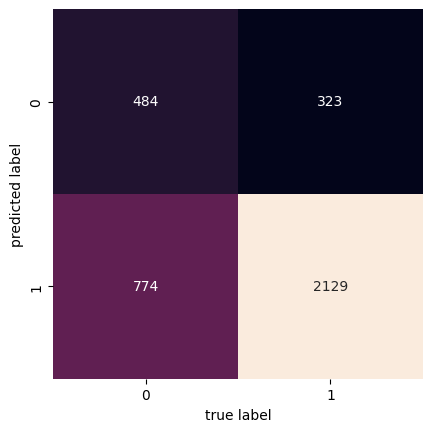

In [ ]:
mat_samp_EC1 = confusion_matrix(y_test_EC1, y_pred_EC1)
sns.heatmap(mat_samp_EC1.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_samp_EC1, y_test_samp_EC1))

              precision    recall  f1-score   support

           0       0.65      0.67      0.66      2622
           1       0.70      0.69      0.70      3051

    accuracy                           0.68      5673
   macro avg       0.68      0.68      0.68      5673
weighted avg       0.68      0.68      0.68      5673



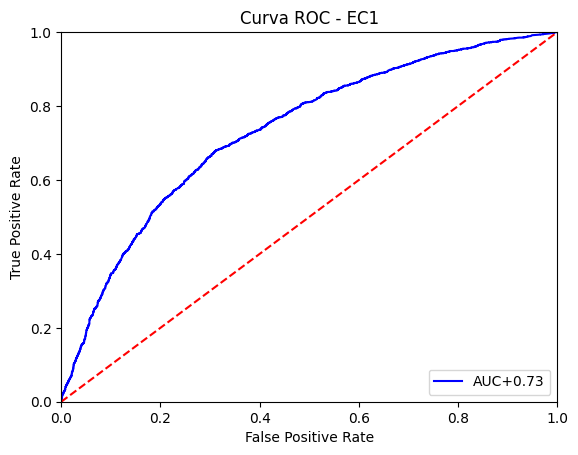

In [ ]:
predicciones = modelo_EC1.predict_proba(X_test_samp_EC1)
pred_EC1 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_samp_EC1, pred_EC1)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC - EC1')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

In [ ]:
modelo_EC2.fit(X_train_sam_EC2, y_train_sam_EC2)
y_pred_samp_EC2 = modelo_EC2.predict(X_test_samp_EC2)

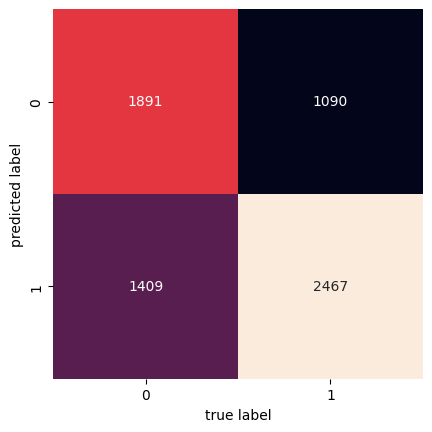

In [ ]:
mat_samp_EC2 = confusion_matrix(y_test_samp_EC2, y_pred_samp_EC2)
sns.heatmap(mat_samp_EC2.T, square=True, annot=True, fmt='d', cbar=False)
plt.xlabel('true label')
plt.ylabel('predicted label');

In [ ]:
print(classification_report(y_pred_samp_EC2, y_test_samp_EC2))

              precision    recall  f1-score   support

           0       0.57      0.63      0.60      2981
           1       0.69      0.64      0.66      3876

    accuracy                           0.64      6857
   macro avg       0.63      0.64      0.63      6857
weighted avg       0.64      0.64      0.64      6857



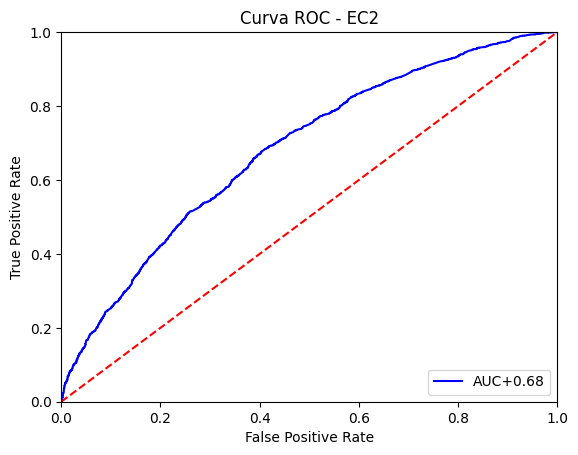

In [ ]:
predicciones = modelo_EC2.predict_proba(X_test_samp_EC2)
pred_EC2 = predicciones[:, 1]
fpr, tpr, threshold = roc_curve(y_test_samp_EC2, pred_EC2)
roc_auc = auc(fpr, tpr)

plt.title('Curva ROC - EC2')
plt.plot(fpr, tpr, 'b', label= 'AUC+%0.2f' % roc_auc)
plt.legend(loc='lower right')
plt.plot([0,1], [0,1], 'r--')
plt.xlim([0,1])
plt.ylim([0,1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show();

Entrega de resultados

In [ ]:
# Store IDs for later use in a submission file
test_id = test['id']

# Drop 'id' column from test data
test = test.drop(columns=['id'])

KeyError: ignored

In [ ]:
# Preprocess test data
test['EC1'] = np.zeros(test.shape[0])
test['EC2'] = np.zeros(test.shape[0])
test_data_scaled = transformer.transform(test)
test_data_scaled = pd.DataFrame(test_data_scaled, columns=test.columns)
test_data_scaled = test_data_scaled.drop(['EC1', 'EC2'], axis=1)
# Train the models on the original data
modelo_EC1.fit(X_train_sam_EC1, y_train_sam_EC1)
modelo_EC2.fit(X_train_sam_EC2, y_train_sam_EC2)

# Make predictions on the test data
predictions_EC1 = modelo_EC1.predict_proba(test_data_scaled)[:, 1]
predictions_EC2 = modelo_EC2.predict_proba(test_data_scaled)[:, 1]

In [ ]:
# Create a submission dataframe
submission_samp_trainings = pd.DataFrame({
    'id': test_id,
    'EC1': predictions_EC1,
    'EC2': predictions_EC2
})
submission_samp_trainings.set_index('id')
submission_samp_trainings.to_csv('Enzyme_Substrate_Dataset_sampled_splt_train.csv', index=False)
submission_samp_trainings.head()

,id,EC1,EC2
0,14838,0.492891,0.500338
1,14839,0.513757,0.514920
2,14840,0.507135,0.501692
3,14841,0.502912,0.511737
4,14842,0.505429,0.501430


In [ ]:
modelo_EC1.fit(oversamp_EC1, y_sampled_EC1)
modelo_EC2.fit(oversamp_EC2, y_sampled_EC2)

# Make predictions on the test data
predictions_samp_EC1 = modelo_EC1.predict_proba(test_data_scaled)[:, 1]
predictions_samp_EC2 = modelo_EC2.predict_proba(test_data_scaled)[:, 1]

In [ ]:
# Create a submission dataframe
submission_sampledT = pd.DataFrame({
    'id': test_id,
    'EC1': predictions_samp_EC1,
    'EC2': predictions_samp_EC2
})
submission_sampledT.set_index('id')
submission_sampledT.to_csv('Enzyme_Substrate_Dataset_oversampled.csv', index=False)
submission_sampledT.head()

,id,EC1,EC2
0,14838,0.492820,0.500885
1,14839,0.513987,0.516203
2,14840,0.507242,0.500171
3,14841,0.502245,0.516016
4,14842,0.505902,0.500369


In [ ]:
import os
current_directory = os.getcwd()

file_path = os.path.join(current_directory, 'Enzyme_Substrate_Dataset_oversampled.csv')
print(file_path)


/content/Enzyme_Substrate_Dataset_oversampled.csv


In [ ]:
from google.colab import files
files.download('/content/Enzyme_Substrate_Dataset_oversampled.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download('Enzyme_Substrate_Dataset_sampled_splt_train.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Puntaje de Precision obtenido: 0.64